# Azure OpenAI benchmarks

<img src="logo.jpg">


- This notebook will do some benchmarks tests on Azure OpenAI models on PayGo and/or PTU.
- This notebook is using the GitGub repo from Microsoft: https://github.com/Azure/azure-openai-benchmark

### Predefined scenarios
<img src="image1.jpg">

### Profiles
<img src="image2.jpg">

### Generated metrics
<img src="image3.jpg">

In [1]:
import datetime
import json
import matplotlib.pyplot as plt
import openai
import os
import pandas as pd
import plotly.express as px
import seaborn as sns
import shutil
import subprocess
import sweetviz as sv
import sys
import time

from IPython.display import FileLink
from openai import AzureOpenAI
from plotly.subplots import make_subplots

In [2]:
print(f"Today is {str(datetime.datetime.today())}")

Today is 2024-06-19 16:16:06.220872


In [3]:
print(f"Python version: {sys.version}")
print(f"OpenAI version: {openai.__version__}")

Python version: 3.10.11 (main, May 16 2023, 00:28:57) [GCC 11.2.0]
OpenAI version: 1.30.5


### To maximize cells output

In [4]:
%%javascript Python 
OutputArea.auto_scroll_threshold = 9999

<IPython.core.display.Javascript object>

## 1. Settings

In [5]:
HOME = os.getcwd()
print(f"Current directory is: {HOME}")

Current directory is: /mnt/batch/tasks/shared/LS_root/mounts/clusters/seretkow9/code/Users/seretkow/Benchmarks


In [6]:
# Dir to save all the generated results
RES_DIR = "results"
os.makedirs(RES_DIR, exist_ok=True)

RESULTS_DIR = f"{RES_DIR}/results_{datetime.datetime.today().strftime('%d%b%Y_%H%M%S')}"
os.makedirs(RESULTS_DIR, exist_ok=True)

In [7]:
# Dir to download the github repo from https://github.com/Azure/azure-openai-benchmark
DIR_BENCHMARK = 'azure-openai-benchmark'

# Delete the dir
shutil.rmtree(DIR_BENCHMARK)

In [8]:
!git clone https://github.com/Azure/azure-openai-benchmark

Cloning into 'azure-openai-benchmark'...
remote: Enumerating objects: 224, done.
remote: Counting objects: 100% (158/158), done.
remote: Compressing objects: 100% (53/53), done.
remote: Total 224 (delta 129), reused 105 (delta 105), pack-reused 66
Receiving objects: 100% (224/224), 59.84 KiB | 149.00 KiB/s, done.
Resolving deltas: 100% (137/137), done.


In [9]:
os.chdir(DIR_BENCHMARK)

In [10]:
#!pip install -r requirements.txt

In [11]:
print(f"Current directory is: {os.getcwd()}")

Current directory is: /mnt/batch/tasks/shared/LS_root/mounts/clusters/seretkow9/code/Users/seretkow/Benchmarks/azure-openai-benchmark


## 2. Models to benchmark

### 2.1 Your Azure OpenAI endpoint and key

In [12]:
api_base = "TO_BE_REPLACED
aoai_key = "TO_BE_REPLACED"

api_type: str = "azure"
api_version = "2024-05-01-preview"

### 2.2 Models to compare. You can choose PayGO models or PTU deployed models

In [13]:
MODEL1 = "gpt-4o"
MODEL2 = "gpt-4-turbo-2024-04-09"

print(f"This notebook will do some Azure OpenAI benchmarks on models: {MODEL1} and {MODEL2}")

This notebook will do some Azure OpenAI benchmarks on models: gpt-4o and gpt-4-turbo-2024-04-09


## 3. Syntax and available options from the Microsoft benchmark tool

In [14]:
!python -m benchmark.bench load --help

usage: bench.py load [-h] [-a API_VERSION] [-k API_KEY_ENV] [-c CLIENTS]
                     [-n REQUESTS] [-d DURATION] [-r RATE]
                     [-w AGGREGATION_WINDOW]
                     [-s {balanced,context,generation,custom}]
                     [-p CONTEXT_TOKENS] [-m MAX_TOKENS] [-i COMPLETIONS]
                     [--frequency-penalty FREQUENCY_PENALTY]
                     [--presence-penalty PRESENCE_PENALTY]
                     [--temperature TEMPERATURE] [--top-p TOP_P]
                     [-f {jsonl,human}] [-t {none,exponential}] -e DEPLOYMENT
                     api_base_endpoint

positional arguments:
  api_base_endpoint     Azure OpenAI deployment base endpoint.

optional arguments:
  -h, --help            show this help message and exit
  -a API_VERSION, --api-version API_VERSION
                        Set OpenAI API version.
  -k API_KEY_ENV, --api-key-env API_KEY_ENV
                        Environment variable that contains the API KEY.
  -c CLIENTS,

> Documentation: https://github.com/Azure/azure-openai-benchmark

## 4. Quick test using GPT-4o

In [15]:
MODEL_ENDPOINT = api_base
os.environ['OPENAI_API_KEY'] = aoai_key

In [16]:
print(f"Let's use the {MODEL1} model")

Let's use the gpt-4o model


In [17]:
command = [
    'python', '-m', 'benchmark.bench', 'load',
    '--deployment', MODEL1,  # Model to use
    '--rate', '10',  # RPM
    '--retry', 'exponential',  # Retry
    '--duration', '30',  # Duration in seconds
    MODEL_ENDPOINT  # Model endpoint to use
]

# Run the command
start = time.time()
now = datetime.datetime.today()
print(f"{now} Running benchmarks for model {MODEL1}...")
result = subprocess.run(command, capture_output=True, text=True)
elapsed = time.time() - start
print("Done")
print("Elapsed time: " + time.strftime(
    "%H:%M:%S.{}".format(str(elapsed % 1)[2:])[:15], time.gmtime(elapsed)))

2024-06-19 16:17:07.040026 Running benchmarks for model gpt-4o...
Done
Elapsed time: 00:00:36.819761


In [18]:
print(result.stdout)

2024-06-19 16:17:09 rpm: n/a   processing: 2    completed: 0     failures: 0    throttled: 0    requests: 0     tpm: 0      ttft_avg: n/a    ttft_95th: n/a    tbt_avg: n/a    tbt_95th: n/a    e2e_avg: n/a    e2e_95th: n/a    util_avg: n/a    util_95th: n/a   
2024-06-19 16:17:10 rpm: n/a   processing: 2    completed: 0     failures: 0    throttled: 0    requests: 0     tpm: 0      ttft_avg: n/a    ttft_95th: n/a    tbt_avg: n/a    tbt_95th: n/a    e2e_avg: n/a    e2e_95th: n/a    util_avg: n/a    util_95th: n/a   
2024-06-19 16:17:11 rpm: n/a   processing: 2    completed: 0     failures: 0    throttled: 0    requests: 0     tpm: 0      ttft_avg: n/a    ttft_95th: n/a    tbt_avg: n/a    tbt_95th: n/a    e2e_avg: n/a    e2e_95th: n/a    util_avg: n/a    util_95th: n/a   
2024-06-19 16:17:12 rpm: n/a   processing: 2    completed: 0     failures: 0    throttled: 0    requests: 0     tpm: 0      ttft_avg: n/a    ttft_95th: n/a    tbt_avg: n/a    tbt_95th: n/a    e2e_avg: n/a    e2e_95th: n/

In [19]:
print(result.stderr)

2024-06-19 16:17:08 INFO     using shape profile balanced: context tokens: 500, max tokens: 500
2024-06-19 16:17:08 INFO     warming up prompt cache
2024-06-19 16:17:08 INFO     starting load...
2024-06-19 16:17:38 INFO     waiting for 6 requests to drain
2024-06-19 16:17:43 INFO     finished load test



## 5. Advanced testing with model 1 (GPT-4o)

In [20]:
print(f"Benchmarks for model {MODEL1}")

Benchmarks for model gpt-4o


In [21]:
# With output file generation
OUTPUT_FILE = os.path.join(HOME, RESULTS_DIR, f"benchmarks_{MODEL1}.txt")

command = [
    'python', '-m', 'benchmark.bench', 'load',
    '--deployment', MODEL1,  # Model to use
    '--rate', '30',  # RPM
    '--duration', '300',  # Duration in seconds (should be > 30)
    '--shape', 'custom',  # Custom request shape
    '--context-tokens', '1000',  # Context tokens
    '--max-tokens', '500',  # Max tokens
    '--output-format', 'human',  # Output format
    MODEL_ENDPOINT  # Model endpoint to use
]

# Running the benchmarks
start = time.time()
now = datetime.datetime.today()
print(f"{now} Running benchmarks for model {MODEL1}...")
result = subprocess.run(command, capture_output=True, text=True)
elapsed = time.time() - start

# Saving the results into a file
with open(OUTPUT_FILE, 'w') as f:
    f.write(result.stdout)

print(f"Benchmark output saved to file {OUTPUT_FILE}")
print("Elapsed time: " + time.strftime(
    "%H:%M:%S.{}".format(str(elapsed % 1)[2:])[:15], time.gmtime(elapsed)))

2024-06-19 16:21:22.999886 Running benchmarks for model gpt-4o...
Benchmark output saved to file /mnt/batch/tasks/shared/LS_root/mounts/clusters/seretkow9/code/Users/seretkow/Benchmarks/results/results_19Jun2024_161612/benchmarks_gpt-4o.txt
Elapsed time: 00:05:07.220996


In [22]:
# Define the columns to read and their corresponding indices in the file
columns = {
    'timestamp': (0, 2),
    'rpm': 3,
    'processing': 5,
    'completed': 7,
    'failures': 9,
    'throttled': 11,
    'requests': 13,
    'tpm': 15,
    'ttft_avg': 17,
    'ttft_95th': 19,
    'tbt_avg': 21,
    'tbt_95th': 23,
    'e2e_avg': 25,
    'e2e_95th': 27,
    'util_avg': 29,
    'util_95th': 31
}

data = {key: [] for key in columns.keys()}

# Reading file
with open(OUTPUT_FILE, 'r') as file:
    for line in file:
        fields = line.strip().split()
        for key, idx in columns.items():
            if isinstance(idx, tuple):
                value = ' '.join(fields[idx[0]:idx[1]])
            else:
                value = fields[idx]
            data[key].append(value)

df1 = pd.DataFrame(data)
df1 = df1.replace('n/a', 0)
int_columns = ['processing', 'completed', 'failures', 'throttled', 'requests']
float_columns = [
    'rpm', 'tpm', 'ttft_avg', 'ttft_95th', 'tbt_avg', 'tbt_95th', 'e2e_avg',
    'e2e_95th', 'util_avg', 'util_95th'
]
df1[int_columns] = df1[int_columns].astype(int)
df1[float_columns] = df1[float_columns].astype(float)
df1['model'] = MODEL1

In [23]:
df1

,timestamp,rpm,processing,completed,failures,throttled,requests,tpm,ttft_avg,ttft_95th,tbt_avg,tbt_95th,e2e_avg,e2e_95th,util_avg,util_95th,model
0,2024-06-19 16:21:25,0.0,2,0,0,0,0,0.0,0.000,0.000,0.000,0.000,0.000,0.000,0.0,0.0,gpt-4o
1,2024-06-19 16:21:26,0.0,2,0,0,0,0,0.0,0.000,0.000,0.000,0.000,0.000,0.000,0.0,0.0,gpt-4o
2,2024-06-19 16:21:27,0.0,3,0,0,0,0,0.0,0.000,0.000,0.000,0.000,0.000,0.000,0.0,0.0,gpt-4o
3,2024-06-19 16:21:28,0.0,3,0,0,0,0,0.0,0.000,0.000,0.000,0.000,0.000,0.000,0.0,0.0,gpt-4o
4,2024-06-19 16:21:29,0.0,4,0,0,0,0,0.0,0.000,0.000,0.000,0.000,0.000,0.000,0.0,0.0,gpt-4o
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
301,2024-06-19 16:26:26,26.0,2,144,0,0,144,39104.0,0.157,0.217,0.012,0.014,6.061,6.862,0.0,0.0,gpt-4o
302,2024-06-19 16:26:27,25.0,2,144,0,0,144,37600.0,0.157,0.221,0.012,0.014,6.061,6.862,0.0,0.0,gpt-4o
303,2024-06-19 16:26:28,26.0,1,145,0,0,145,39104.0,0.157,0.217,0.012,0.014,6.060,6.862,0.0,0.0,gpt-4o
304,2024-06-19 16:26:29,25.0,1,145,0,0,145,37600.0,0.157,0.221,0.012,0.014,6.060,6.862,0.0,0.0,gpt-4o


In [24]:
df1.describe()

,rpm,processing,completed,failures,throttled,requests,tpm,ttft_avg,ttft_95th,tbt_avg,tbt_95th,e2e_avg,e2e_95th,util_avg,util_95th
count,306.000000,306.000000,306.000000,306.0,306.0,306.000000,306.000000,306.000000,306.000000,306.000000,306.000000,306.000000,306.000000,306.0,306.0
mean,25.682680,2.892157,72.343137,0.0,0.0,72.343137,38626.529412,0.166196,0.261337,0.011621,0.012709,5.928382,6.635052,0.0,0.0
std,3.892152,0.559394,42.762745,0.0,0.0,42.762745,5852.709868,0.031431,0.049649,0.001683,0.001870,0.841160,0.957014,0.0,0.0
min,0.000000,0.000000,0.000000,0.0,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.0,0.0
25%,26.000000,3.000000,36.000000,0.0,0.0,36.000000,39104.000000,0.160000,0.245000,0.012000,0.013000,6.003000,6.780000,0.0,0.0
50%,26.050000,3.000000,72.000000,0.0,0.0,72.000000,39169.500000,0.163000,0.258000,0.012000,0.013000,6.054000,6.840000,0.0,0.0
75%,27.000000,3.000000,109.000000,0.0,0.0,109.000000,40608.000000,0.172000,0.271000,0.012000,0.013000,6.066000,6.848000,0.0,0.0
max,27.500000,4.000000,146.000000,0.0,0.0,146.000000,41296.000000,0.299000,0.337000,0.012000,0.014000,6.209000,6.865000,0.0,0.0


In [25]:
cols_to_plot = int_columns + float_columns
cols_to_plot

['processing',
 'completed',
 'failures',
 'throttled',
 'requests',
 'rpm',
 'tpm',
 'ttft_avg',
 'ttft_95th',
 'tbt_avg',
 'tbt_95th',
 'e2e_avg',
 'e2e_95th',
 'util_avg',
 'util_95th']

### 5.1 Lineplots using Plotly

In [26]:
for col in cols_to_plot:
    fig = px.line(df1,
                  x=df1.index,
                  y=df1[col],
                  title=f'{col} for model {MODEL1}')
    fig.show()

### 5.2 Lineplots using Seaborn

In [27]:
df1 = df1.reset_index()

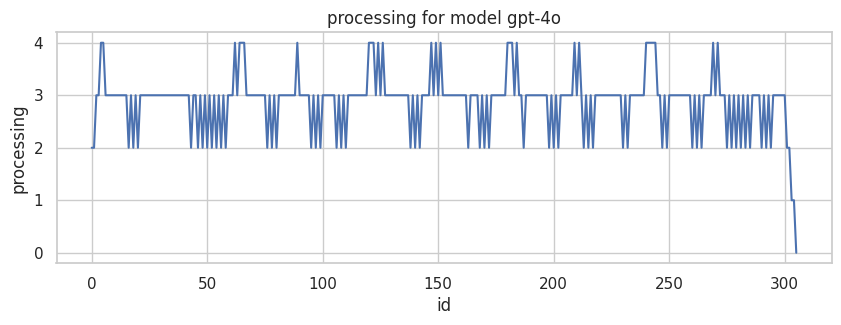

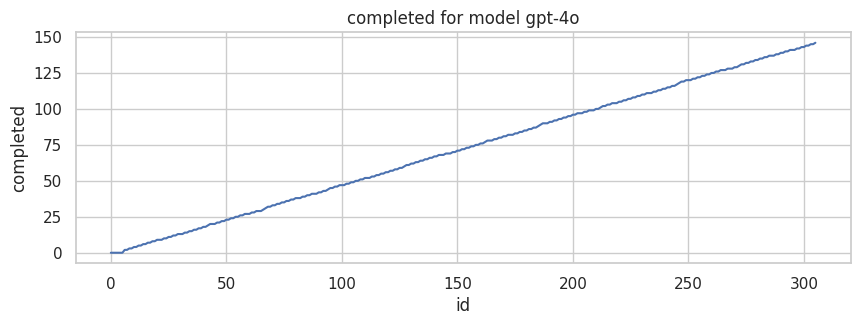

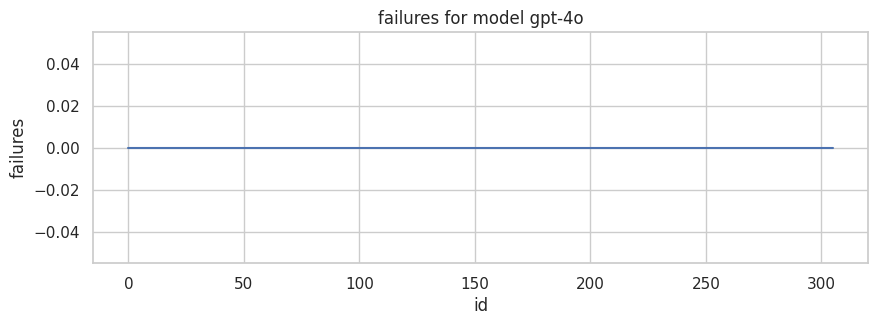

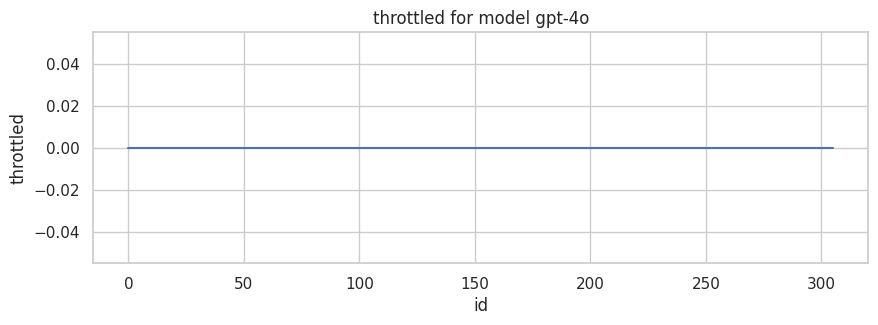

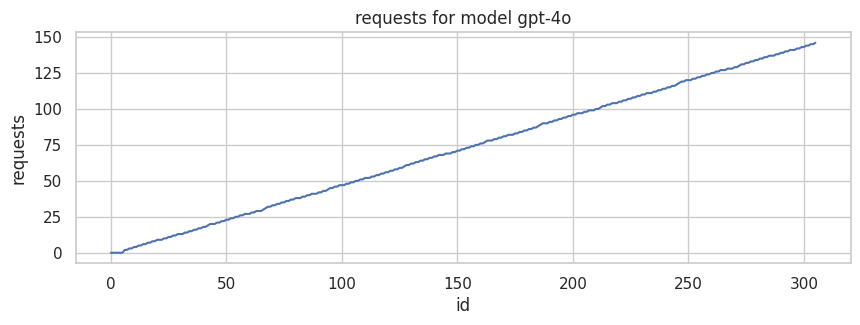

...

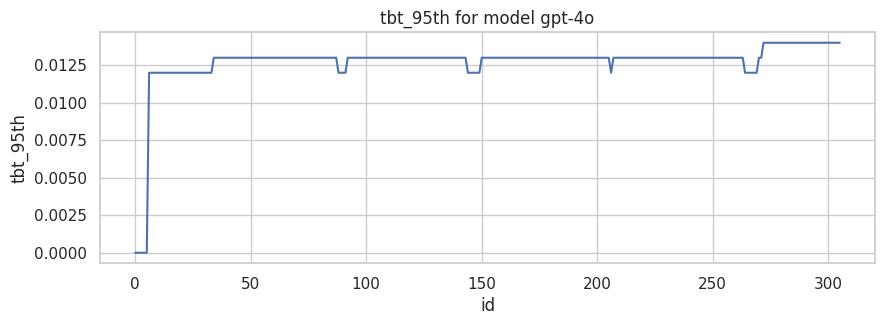

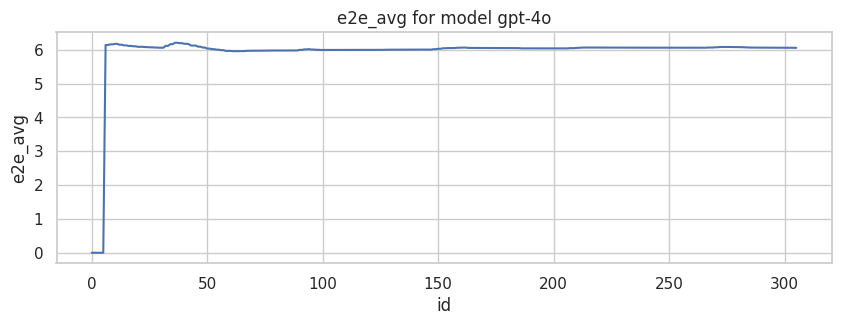

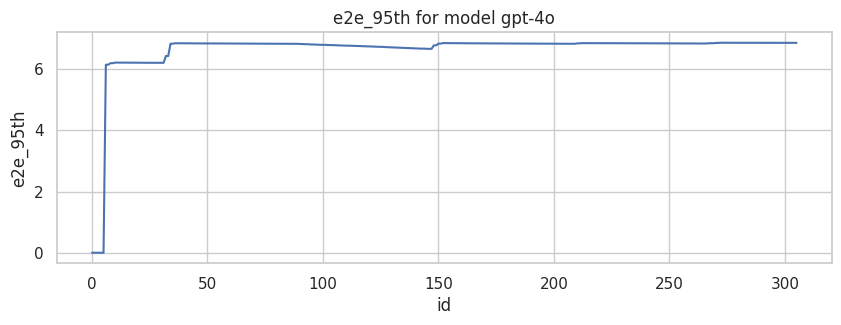

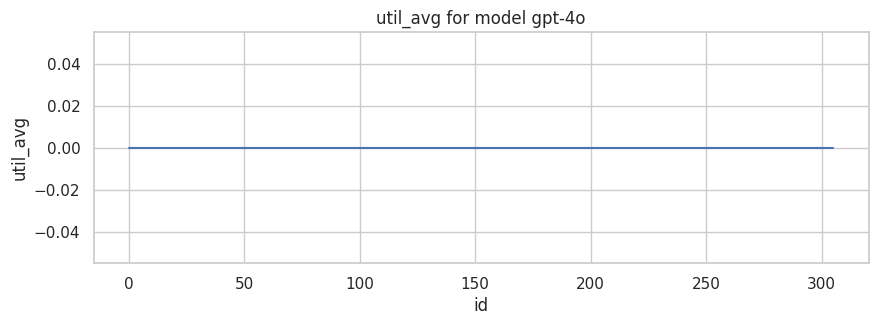

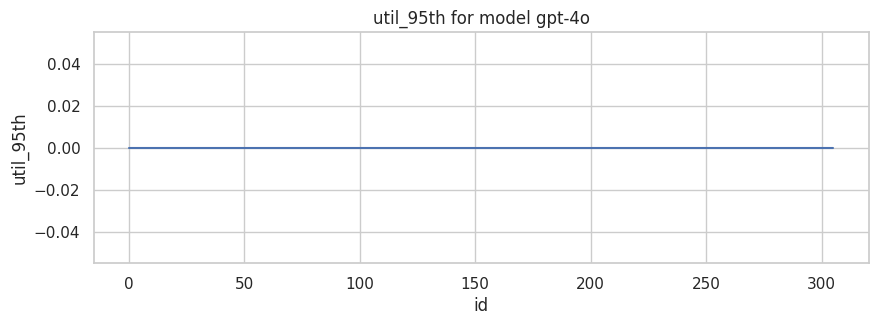

In [28]:
sns.set(style="whitegrid")

for col in cols_to_plot:
    plt.figure(figsize=(10, 3))
    sns.lineplot(data=df1, x='index', y=col)
    plt.title(f'{col} for model {MODEL1}')
    plt.xlabel('id')
    plt.ylabel(col)
    plt.show()

### 5.3 Boxplots using Plotly

In [29]:
for col in cols_to_plot:
    fig = px.box(df1, y=df1[col], title=f'{col} for model {MODEL1}')
    fig.show()

### 5.4 Boxplots using Seaborn

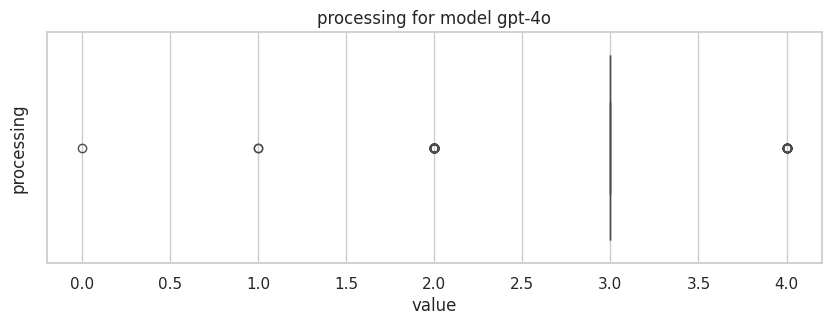

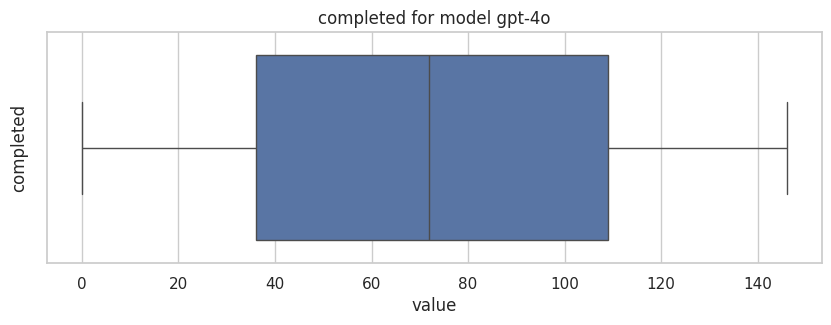

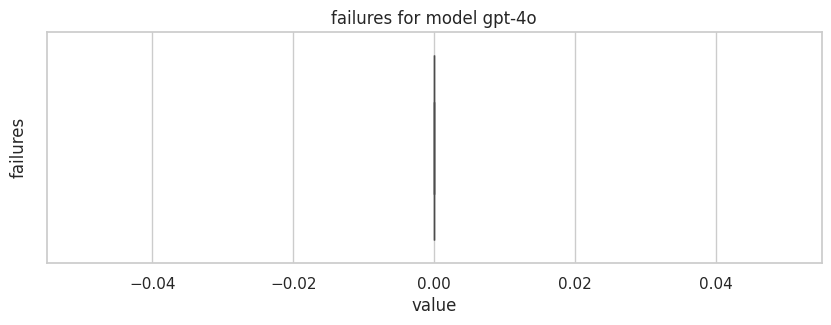

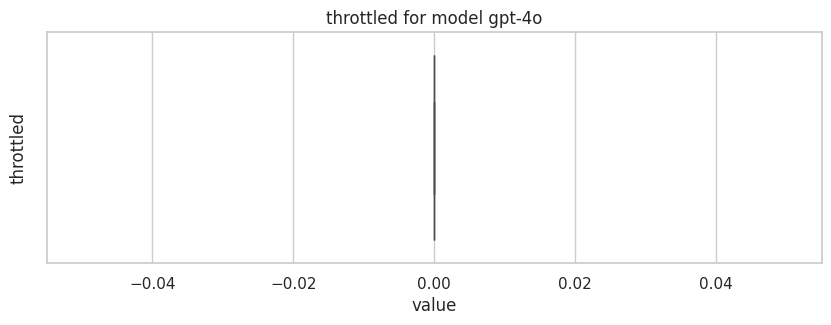

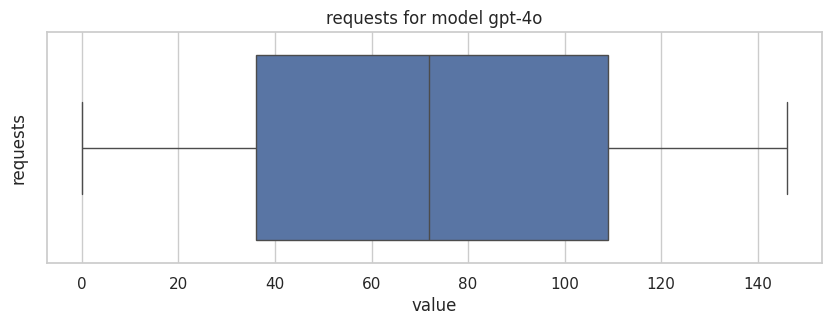

...

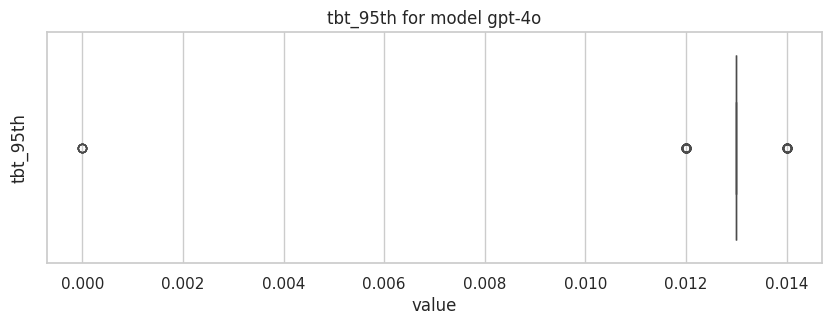

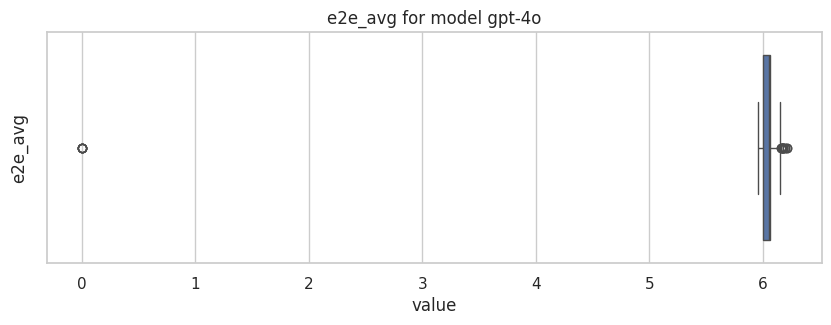

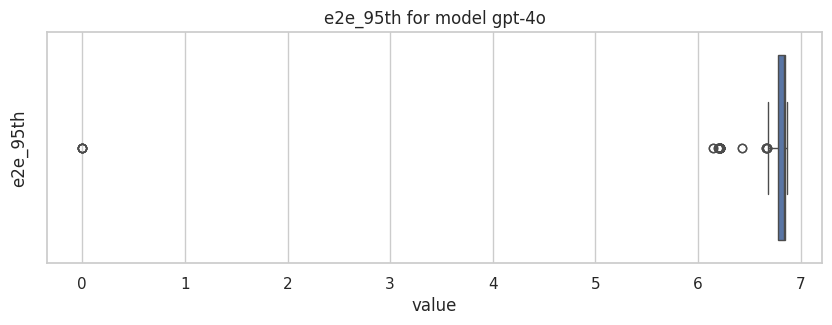

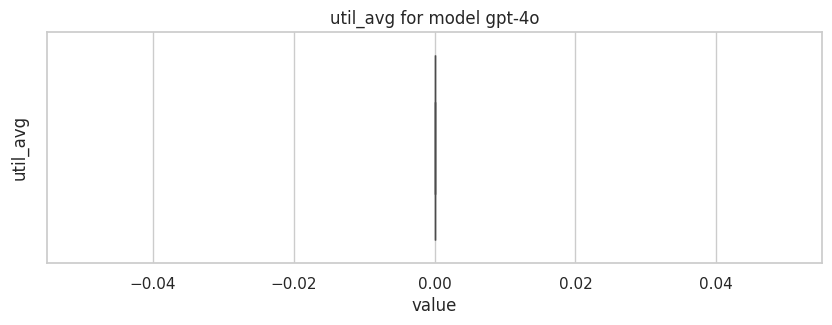

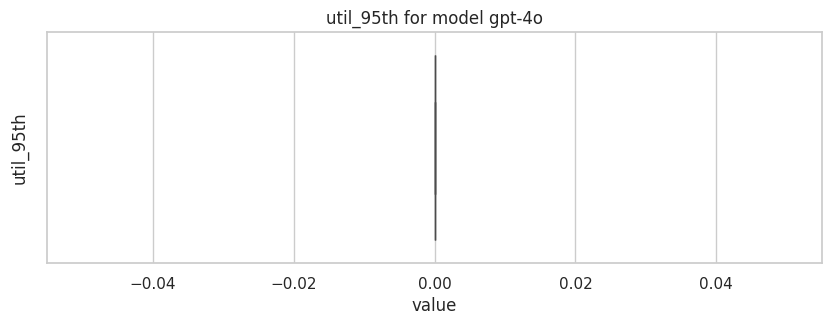

In [30]:
sns.set(style="whitegrid")

for col in cols_to_plot:
    plt.figure(figsize=(10, 3))
    sns.boxplot(x=df1[col])
    plt.title(f'{col} for model {MODEL1}')
    plt.xlabel('value')
    plt.ylabel(col)
    plt.show()

## 6. Comparing benchmarks

### 6.1 Running benchmarks from the second model

In [31]:
print(f"Benchmarks for model {MODEL2}")

Benchmarks for model gpt-4-turbo-2024-04-09


In [32]:
# With output file generation
OUTPUT_FILE = os.path.join(HOME, RESULTS_DIR, f"benchmarks_{MODEL2}.txt")

command = [
    'python', '-m', 'benchmark.bench', 'load',
    '--deployment', MODEL2,  # Model to use
    '--rate', '30',  # RPM
    '--duration', '300',  # Duration in seconds (should be > 30)
    '--shape', 'custom',  # Custom request shape
    '--context-tokens', '1000',  # Context tokens
    '--max-tokens', '500',  # Max tokens
    '--output-format', 'human',  # Output format
    MODEL_ENDPOINT  # Model endpoint to use
]

# Running the benchmarks
start = time.time()
now = datetime.datetime.today()
print(f"{now} Running benchmarks for model {MODEL2}...")
result = subprocess.run(command, capture_output=True, text=True)
elapsed = time.time() - start

# Saving the results into a file
with open(OUTPUT_FILE, 'w') as f:
    f.write(result.stdout)

print(f"Benchmark output saved to file {OUTPUT_FILE}")
print("Elapsed time: " + time.strftime(
    "%H:%M:%S.{}".format(str(elapsed % 1)[2:])[:15], time.gmtime(elapsed)))

2024-06-19 16:27:34.042284 Running benchmarks for model gpt-4-turbo-2024-04-09...
Benchmark output saved to file /mnt/batch/tasks/shared/LS_root/mounts/clusters/seretkow9/code/Users/seretkow/Benchmarks/results/results_19Jun2024_161612/benchmarks_gpt-4-turbo-2024-04-09.txt
Elapsed time: 00:05:33.074314


In [33]:
# Define the columns to read and their corresponding indices in the file
columns = {
    'timestamp': (0, 2),
    'rpm': 3,
    'processing': 5,
    'completed': 7,
    'failures': 9,
    'throttled': 11,
    'requests': 13,
    'tpm': 15,
    'ttft_avg': 17,
    'ttft_95th': 19,
    'tbt_avg': 21,
    'tbt_95th': 23,
    'e2e_avg': 25,
    'e2e_95th': 27,
    'util_avg': 29,
    'util_95th': 31
}

data = {key: [] for key in columns.keys()}

# Reading file
with open(OUTPUT_FILE, 'r') as file:
    for line in file:
        fields = line.strip().split()
        for key, idx in columns.items():
            if isinstance(idx, tuple):
                value = ' '.join(fields[idx[0]:idx[1]])
            else:
                value = fields[idx]
            data[key].append(value)

df2 = pd.DataFrame(data)
df2 = df2.replace('n/a', 0)
int_columns = ['processing', 'completed', 'failures', 'throttled', 'requests']
float_columns = [
    'rpm', 'tpm', 'ttft_avg', 'ttft_95th', 'tbt_avg', 'tbt_95th', 'e2e_avg',
    'e2e_95th', 'util_avg', 'util_95th'
]
df2[int_columns] = df2[int_columns].astype(int)
df2[float_columns] = df2[float_columns].astype(float)
df2['model'] = MODEL2

In [34]:
df2

,timestamp,rpm,processing,completed,failures,throttled,requests,tpm,ttft_avg,ttft_95th,tbt_avg,tbt_95th,e2e_avg,e2e_95th,util_avg,util_95th,model
0,2024-06-19 16:27:36,0.0,2,0,0,0,0,0.0,0.000,0.000,0.000,0.000,0.000,0.000,0.0,0.0,gpt-4-turbo-2024-04-09
1,2024-06-19 16:27:37,0.0,2,0,0,0,0,0.0,0.000,0.000,0.000,0.000,0.000,0.000,0.0,0.0,gpt-4-turbo-2024-04-09
2,2024-06-19 16:27:38,0.0,3,0,0,0,0,0.0,0.000,0.000,0.000,0.000,0.000,0.000,0.0,0.0,gpt-4-turbo-2024-04-09
3,2024-06-19 16:27:39,0.0,3,0,0,0,0,0.0,0.000,0.000,0.000,0.000,0.000,0.000,0.0,0.0,gpt-4-turbo-2024-04-09
4,2024-06-19 16:27:40,0.0,4,0,0,0,0,0.0,0.000,0.000,0.000,0.000,0.000,0.000,0.0,0.0,gpt-4-turbo-2024-04-09
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
327,2024-06-19 16:33:03,6.0,1,145,71,71,145,9018.0,1.279,3.857,0.071,0.083,39.518,70.675,0.0,0.0,gpt-4-turbo-2024-04-09
328,2024-06-19 16:33:04,6.0,1,145,71,71,145,9018.0,1.279,3.857,0.071,0.083,39.518,70.675,0.0,0.0,gpt-4-turbo-2024-04-09
329,2024-06-19 16:33:05,6.0,1,145,71,71,145,9018.0,1.279,3.857,0.071,0.083,39.518,70.675,0.0,0.0,gpt-4-turbo-2024-04-09
330,2024-06-19 16:33:06,6.0,1,145,71,71,145,9018.0,1.279,3.857,0.071,0.083,39.518,70.675,0.0,0.0,gpt-4-turbo-2024-04-09


In [35]:
df2.describe()

,rpm,processing,completed,failures,throttled,requests,tpm,ttft_avg,ttft_95th,tbt_avg,tbt_95th,e2e_avg,e2e_95th,util_avg,util_95th
count,332.000000,332.000000,332.000000,332.000000,332.000000,332.000000,332.000000,332.000000,332.000000,332.000000,332.000000,332.000000,332.000000,332.0,332.0
mean,5.827711,9.012048,71.740964,36.593373,36.593373,71.740964,8756.728916,0.731907,1.540289,0.059958,0.070343,35.162322,55.827503,0.0,0.0
std,3.769261,3.993935,46.268810,22.911237,22.911237,46.268810,5663.657301,0.594537,2.161438,0.028032,0.040247,11.979974,21.488228,0.0,0.0
min,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.0,0.0
25%,2.000000,6.000000,30.000000,15.000000,15.000000,30.000000,3006.000000,0.591000,0.657000,0.061750,0.066000,38.682500,56.958000,0.0,0.0
50%,6.000000,9.000000,69.000000,36.000000,36.000000,69.000000,9018.000000,0.685000,0.969000,0.069000,0.079000,39.458000,62.357000,0.0,0.0
75%,9.000000,12.000000,116.000000,60.000000,60.000000,116.000000,13527.000000,0.824000,1.428000,0.073000,0.096000,39.815000,70.698000,0.0,0.0
max,12.000000,16.000000,146.000000,71.000000,71.000000,146.000000,18036.000000,4.861000,13.091000,0.146000,0.146000,40.953000,71.136000,0.0,0.0


### 6.2 Lineplots using Plotly

In [36]:
df2 = df2.reset_index()

In [37]:
for col in cols_to_plot:
    fig = px.line(
        df2,
        x=df2.index,
        y=df2[col],
        title=f'{col} for model {MODEL2}',
        template="ggplot2",
    )
    fig.show()

### 6.3 Lineplots using Seaborn

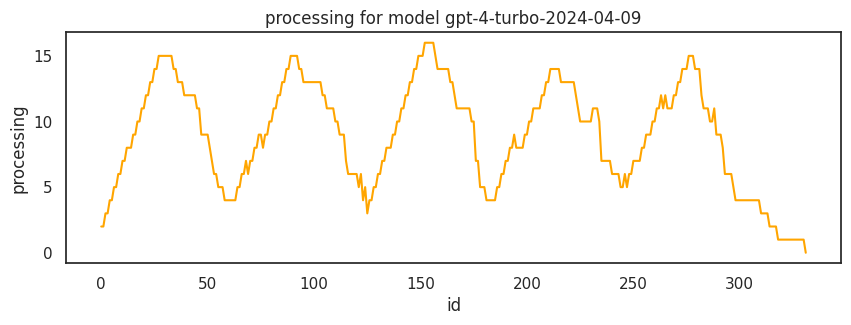

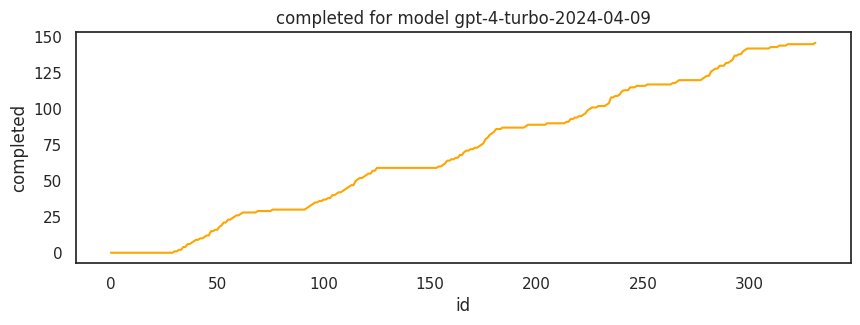

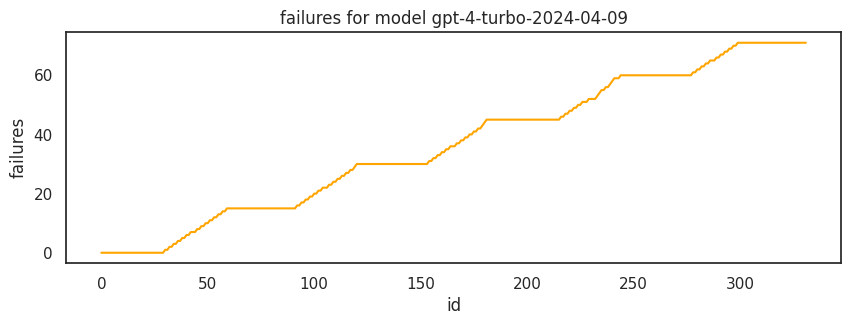

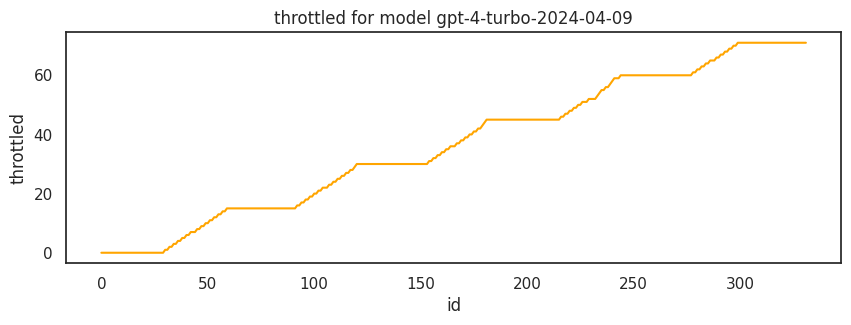

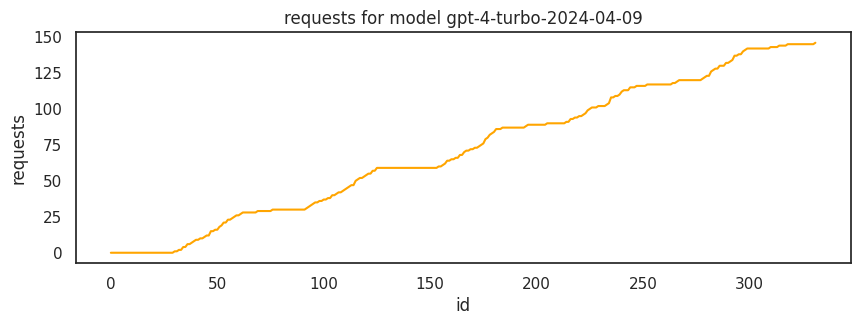

...

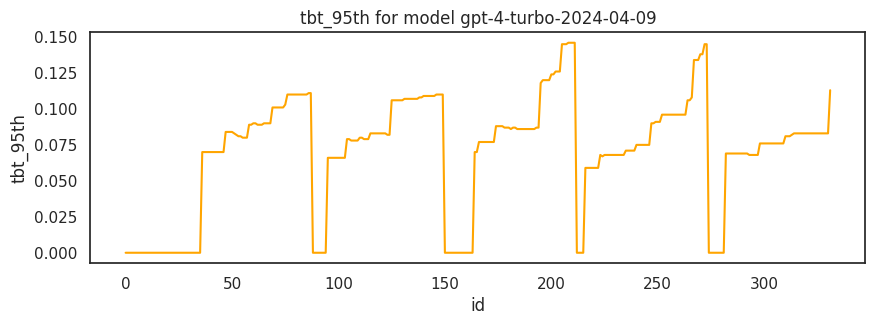

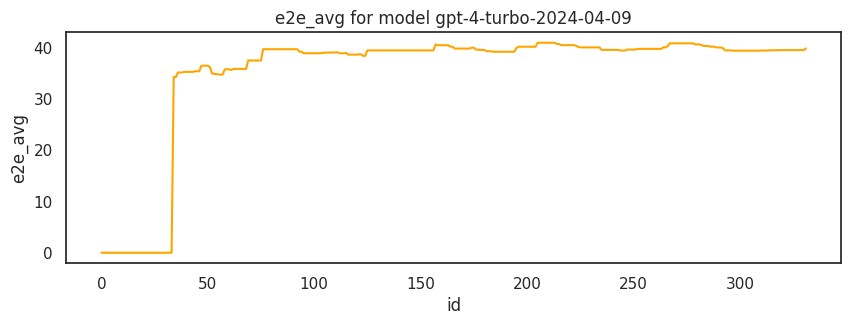

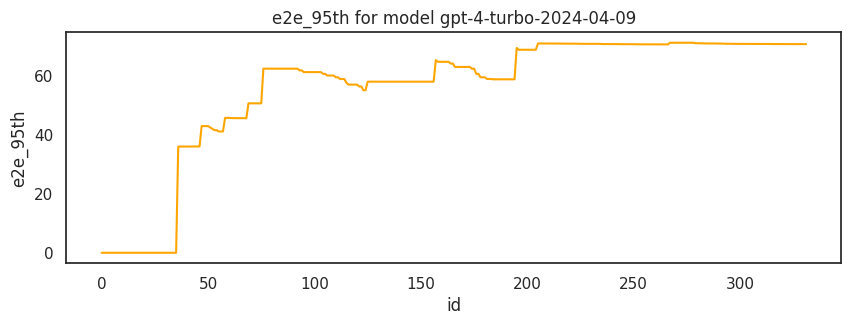

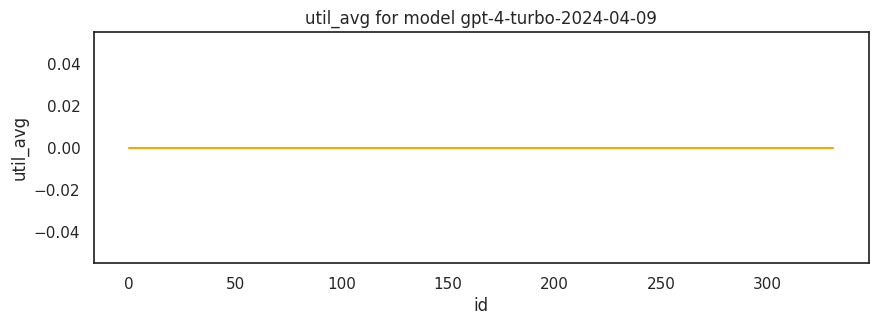

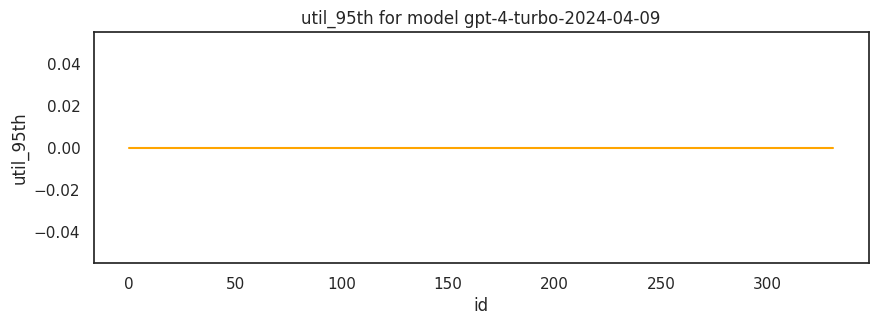

In [38]:
sns.set(style="white")

for col in cols_to_plot:
    plt.figure(figsize=(10, 3))
    sns.lineplot(data=df2, x='index', y=col, color='orange')
    plt.title(f'{col} for model {MODEL2}')
    plt.xlabel('id')
    plt.ylabel(col)
    plt.show()

### 6.4 Boxplots using Plotly

In [39]:
for col in cols_to_plot:
    fig = px.box(df2,
                 y=df2[col],
                 title=f'{col} for model {MODEL2}',
                 template="ggplot2")
    fig.show()

### 6.5 Boxplots using Seaborn

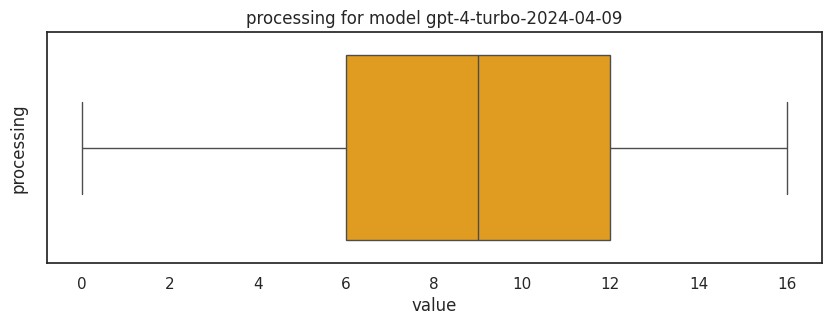

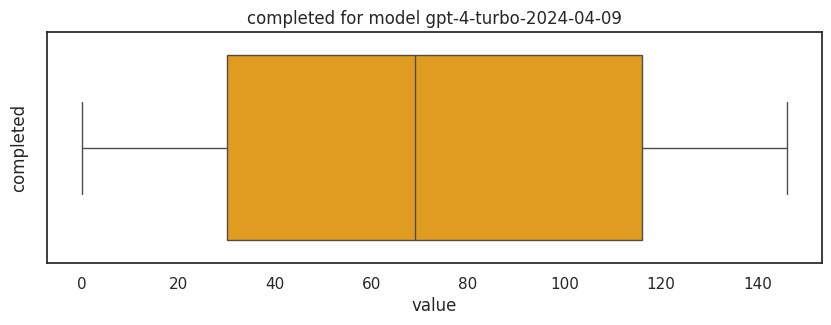

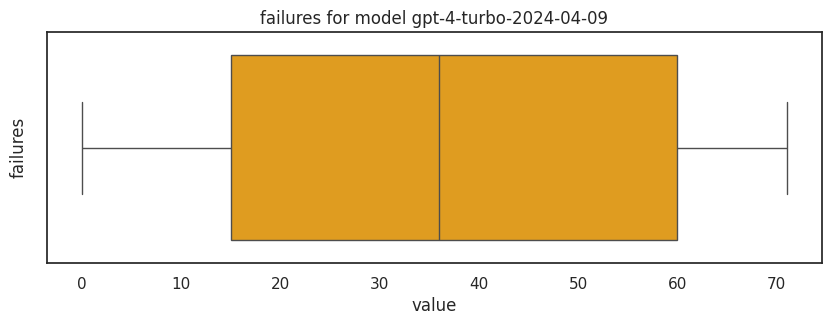

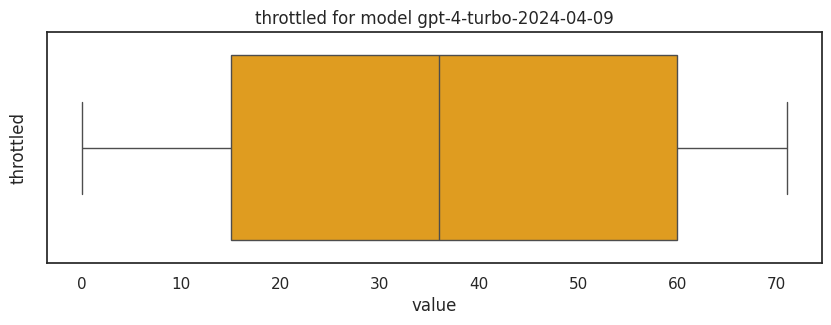

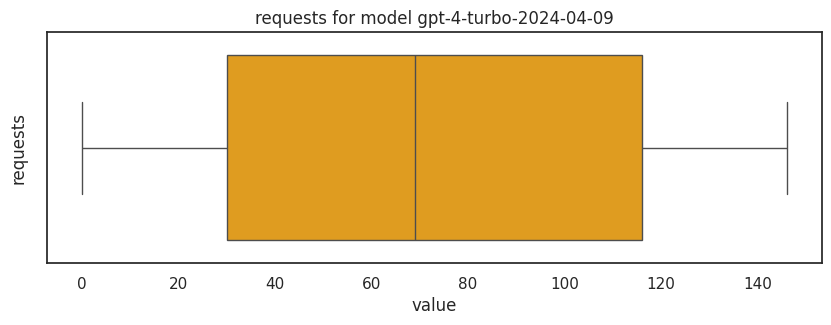

...

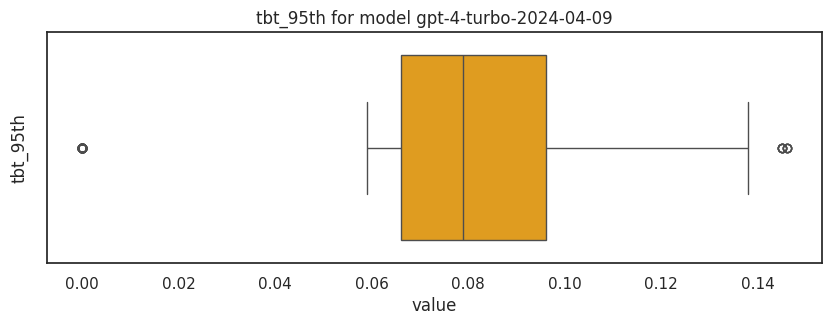

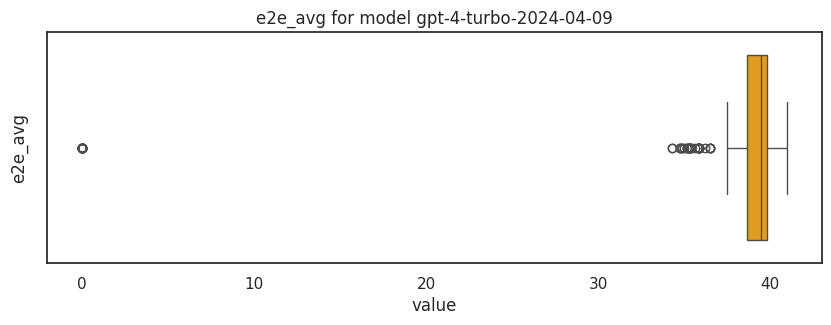

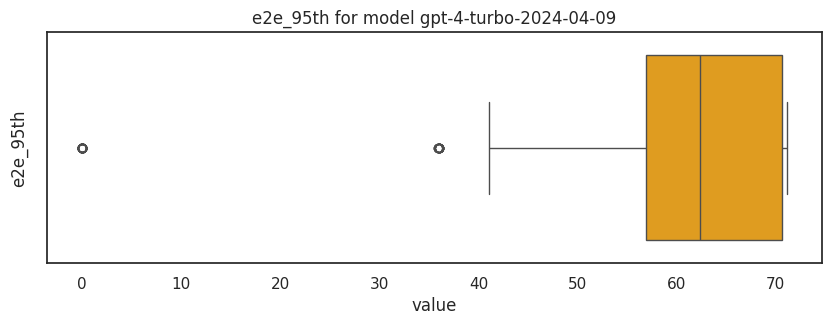

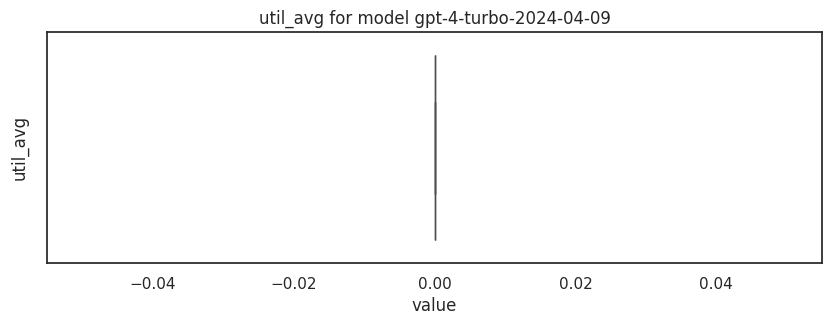

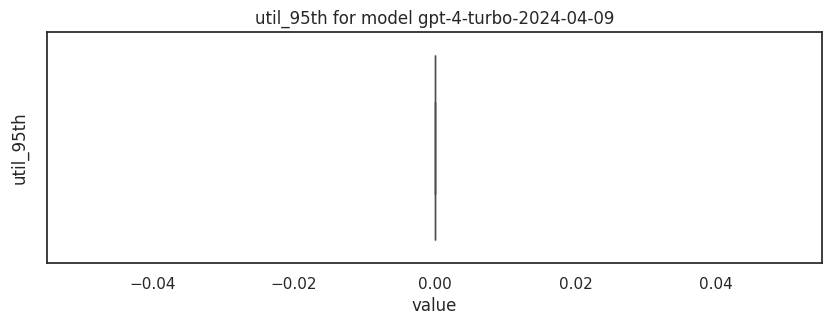

In [40]:
sns.set(style="white")

for col in cols_to_plot:
    plt.figure(figsize=(10, 3))
    sns.boxplot(x=df2[col], color="orange")
    plt.title(f'{col} for model {MODEL2}')
    plt.xlabel('value')
    plt.ylabel(col)
    plt.show()

## 7. Benchmarks comparison results

In [41]:
df1.describe()

,index,rpm,processing,completed,failures,throttled,requests,tpm,ttft_avg,ttft_95th,tbt_avg,tbt_95th,e2e_avg,e2e_95th,util_avg,util_95th
count,306.000000,306.000000,306.000000,306.000000,306.0,306.0,306.000000,306.000000,306.000000,306.000000,306.000000,306.000000,306.000000,306.000000,306.0,306.0
mean,152.500000,25.682680,2.892157,72.343137,0.0,0.0,72.343137,38626.529412,0.166196,0.261337,0.011621,0.012709,5.928382,6.635052,0.0,0.0
std,88.478811,3.892152,0.559394,42.762745,0.0,0.0,42.762745,5852.709868,0.031431,0.049649,0.001683,0.001870,0.841160,0.957014,0.0,0.0
min,0.000000,0.000000,0.000000,0.000000,0.0,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.0,0.0
25%,76.250000,26.000000,3.000000,36.000000,0.0,0.0,36.000000,39104.000000,0.160000,0.245000,0.012000,0.013000,6.003000,6.780000,0.0,0.0
50%,152.500000,26.050000,3.000000,72.000000,0.0,0.0,72.000000,39169.500000,0.163000,0.258000,0.012000,0.013000,6.054000,6.840000,0.0,0.0
75%,228.750000,27.000000,3.000000,109.000000,0.0,0.0,109.000000,40608.000000,0.172000,0.271000,0.012000,0.013000,6.066000,6.848000,0.0,0.0
max,305.000000,27.500000,4.000000,146.000000,0.0,0.0,146.000000,41296.000000,0.299000,0.337000,0.012000,0.014000,6.209000,6.865000,0.0,0.0


In [42]:
df2.describe()

,index,rpm,processing,completed,failures,throttled,requests,tpm,ttft_avg,ttft_95th,tbt_avg,tbt_95th,e2e_avg,e2e_95th,util_avg,util_95th
count,332.000000,332.000000,332.000000,332.000000,332.000000,332.000000,332.000000,332.000000,332.000000,332.000000,332.000000,332.000000,332.000000,332.000000,332.0,332.0
mean,165.500000,5.827711,9.012048,71.740964,36.593373,36.593373,71.740964,8756.728916,0.731907,1.540289,0.059958,0.070343,35.162322,55.827503,0.0,0.0
std,95.984374,3.769261,3.993935,46.268810,22.911237,22.911237,46.268810,5663.657301,0.594537,2.161438,0.028032,0.040247,11.979974,21.488228,0.0,0.0
min,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.0,0.0
25%,82.750000,2.000000,6.000000,30.000000,15.000000,15.000000,30.000000,3006.000000,0.591000,0.657000,0.061750,0.066000,38.682500,56.958000,0.0,0.0
50%,165.500000,6.000000,9.000000,69.000000,36.000000,36.000000,69.000000,9018.000000,0.685000,0.969000,0.069000,0.079000,39.458000,62.357000,0.0,0.0
75%,248.250000,9.000000,12.000000,116.000000,60.000000,60.000000,116.000000,13527.000000,0.824000,1.428000,0.073000,0.096000,39.815000,70.698000,0.0,0.0
max,331.000000,12.000000,16.000000,146.000000,71.000000,71.000000,146.000000,18036.000000,4.861000,13.091000,0.146000,0.146000,40.953000,71.136000,0.0,0.0


### Using Plotly

In [43]:
for col in cols_to_plot:
    combined_df = pd.concat([df1[[col, 'model']], df2[[col, 'model']]])
    fig = px.box(combined_df,
                 x="model",
                 y=col,
                 color='model',
                 title=f"{col}",
                 color_discrete_map={
                     "f'{MODEL1}'": "blue",
                     "f'{MODEL2}'": "green"
                 })
    fig.update_xaxes(title_text="Models",
                     #tickvals=['df1', 'df2'],
                     ticktext=[f"{MODEL1}", f"{MODEL2}"])
    fig.update_layout(showlegend=False, template="seaborn")
    fig.show()

### Using Seaborn

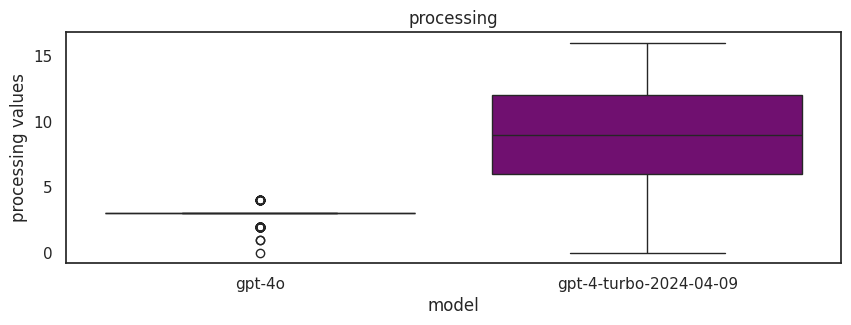

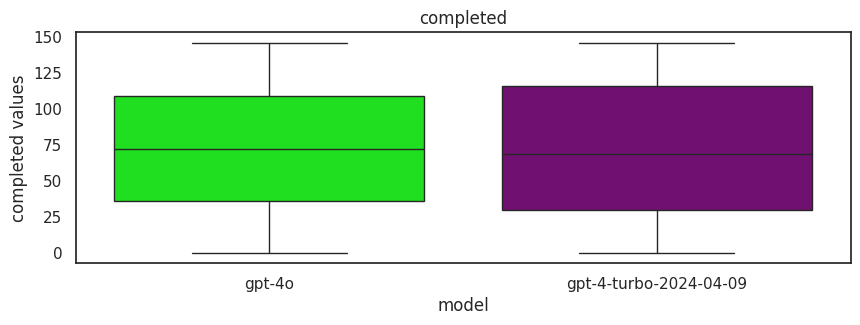

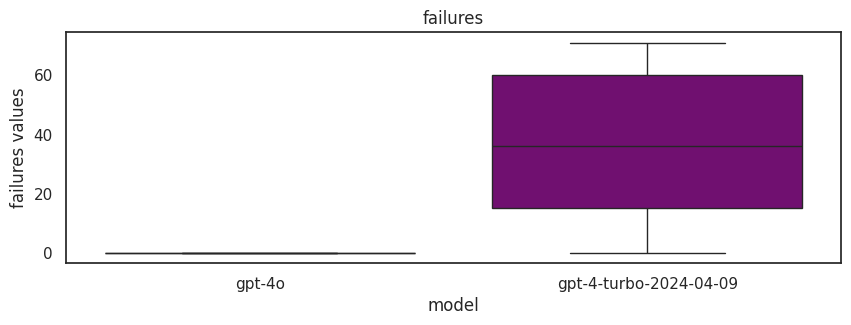

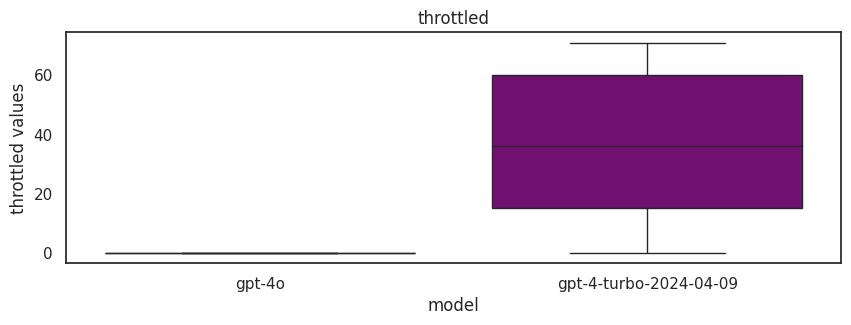

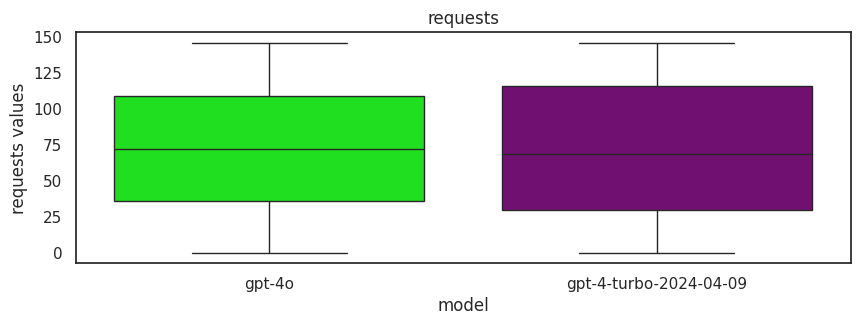

...

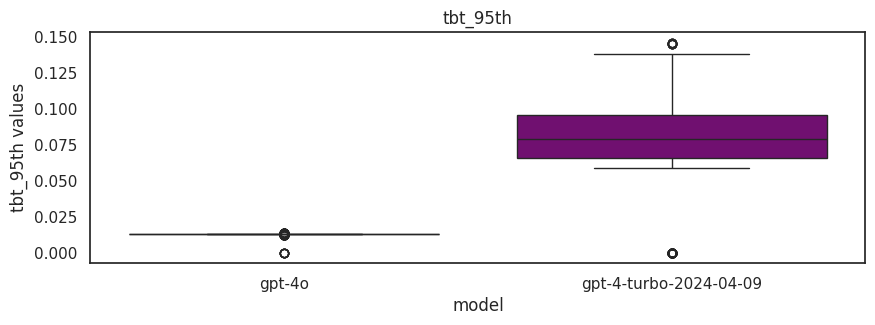

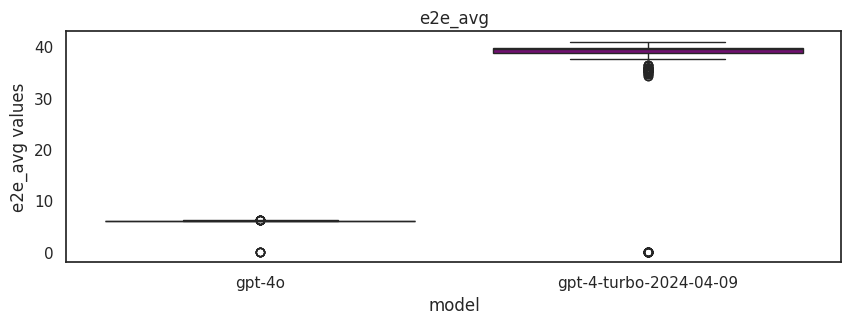

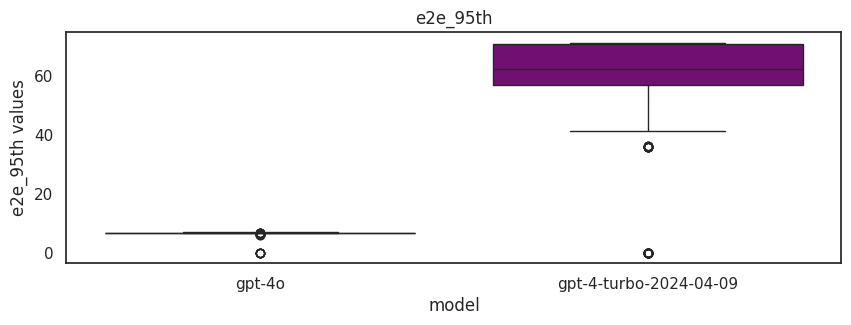

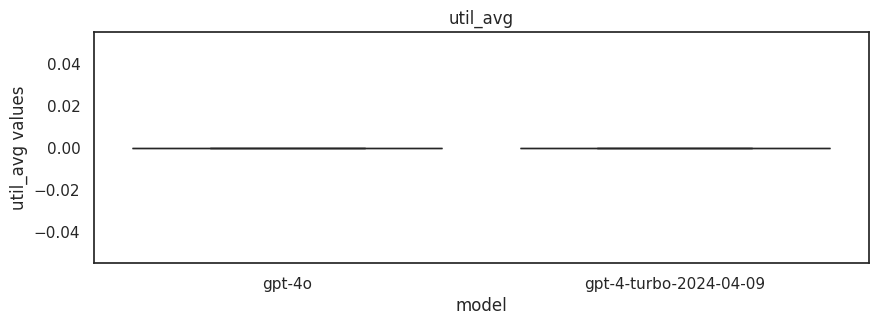

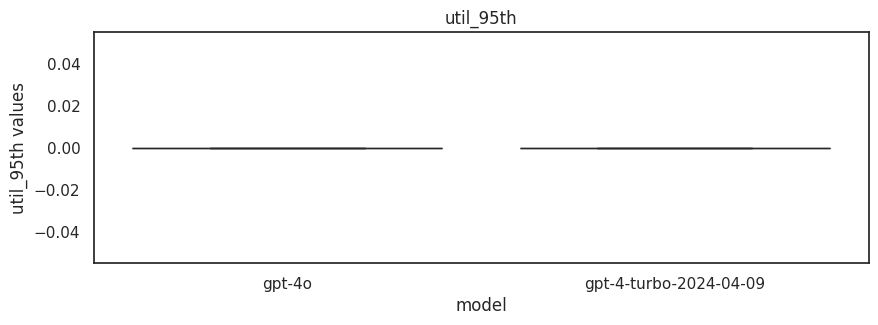

In [44]:
custom_palette = {f"{MODEL1}": 'lime', f"{MODEL2}": 'purple'}

for col in cols_to_plot:
    combined_df = pd.concat([df1[[col, 'model']], df2[[col, 'model']]])
    plt.figure(figsize=(10, 3))
    sns.boxplot(x='model',
                y=col,
                hue='model',
                data=combined_df,
                palette=custom_palette,
                dodge=False,
                legend=False)
    plt.title(f"{col}")
    plt.ylabel(f"{col} values")
    plt.show()

### Excel exports

In [45]:
df1.to_excel(os.path.join(HOME, RESULTS_DIR, f"benchmarks_{MODEL1}.xlsx"))

In [46]:
df2.to_excel(os.path.join(HOME, RESULTS_DIR, f"benchmarks_{MODEL2}.xlsx"))

In [47]:
all_df = pd.concat([df1, df2], ignore_index=True)
all_df.to_excel(
    os.path.join(HOME, RESULTS_DIR, f"benchmarks_{MODEL1}_and_{MODEL2}.xlsx"))

## 8. EDA with sweetviz (optional)

### For Model 1

In [48]:
report1 = sv.analyze(df1)
report1.show_html(os.path.join(HOME, RESULTS_DIR,
                               f"benchmarks_sweetviz_{MODEL1}.html"),
                  open_browser=False)

                                             |          | [  0%]   00:00 -> (? left)

Report /mnt/batch/tasks/shared/LS_root/mounts/clusters/seretkow9/code/Users/seretkow/Benchmarks/results/results_19Jun2024_161612/benchmarks_sweetviz_gpt-4o.html was generated.



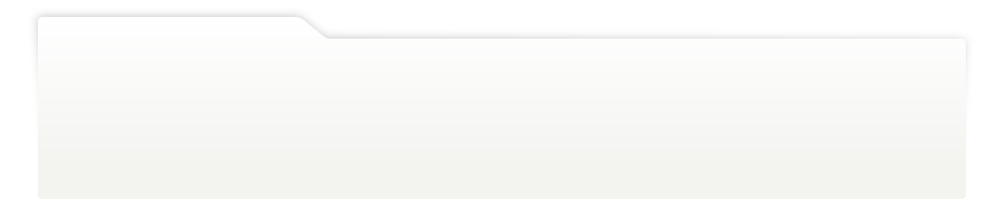
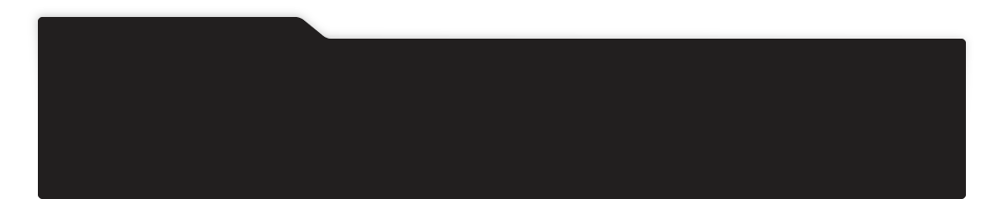
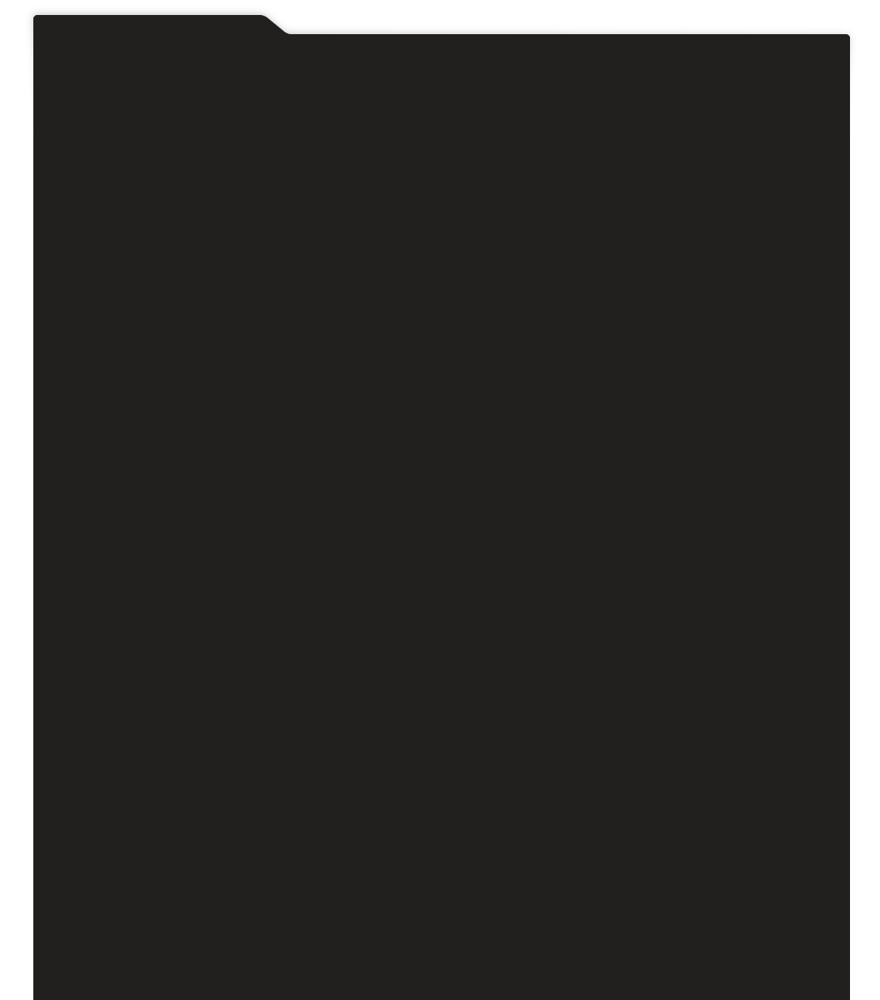
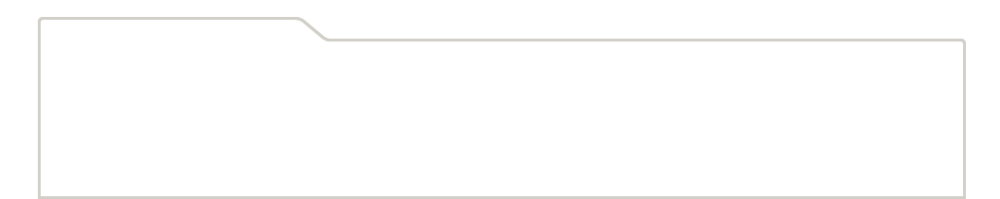
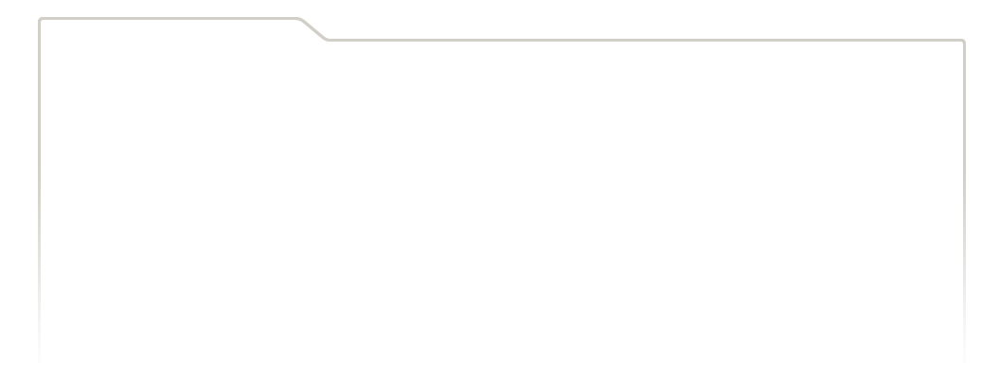
...
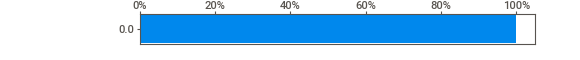
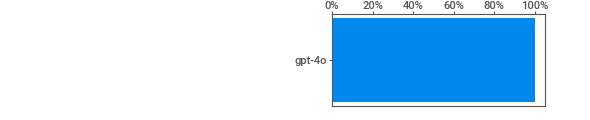
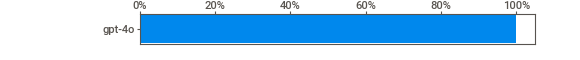
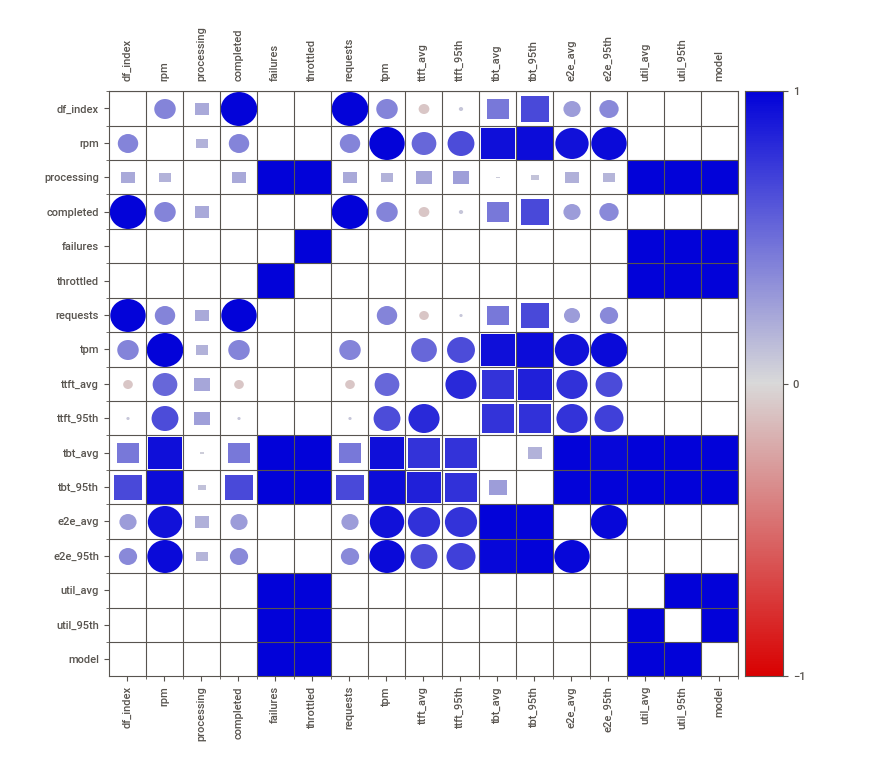
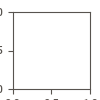

Report '/mnt/batch/tasks/shared/LS_root/mounts/clusters/seretkow9/code/Users/seretkow/Benchmarks/results/results_19Jun2024_161612/benchmarks_sweetviz_gpt-4o.html' was saved to storage.


In [49]:
report1.show_notebook(
    layout='widescreen',
    filepath=os.path.join(HOME, RESULTS_DIR,
                          f"benchmarks_sweetviz_{MODEL1}.html"),
)

### For Model 2

In [50]:
report2 = sv.analyze(df2)
report2.show_html(os.path.join(HOME, RESULTS_DIR,
                               f"benchmarks_sweetviz_{MODEL2}.html"),
                  open_browser=False)

                                             |          | [  0%]   00:00 -> (? left)

Report /mnt/batch/tasks/shared/LS_root/mounts/clusters/seretkow9/code/Users/seretkow/Benchmarks/results/results_19Jun2024_161612/benchmarks_sweetviz_gpt-4-turbo-2024-04-09.html was generated.



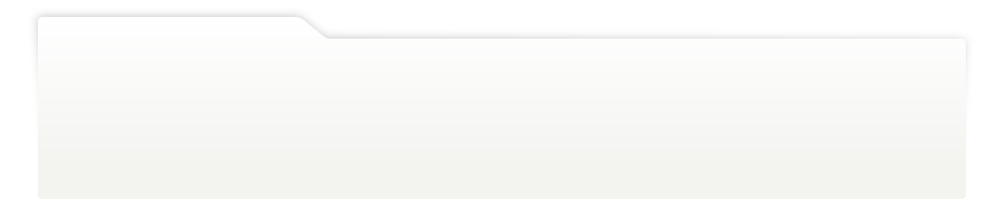
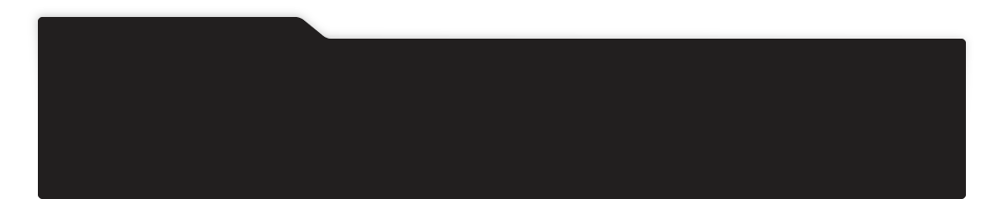
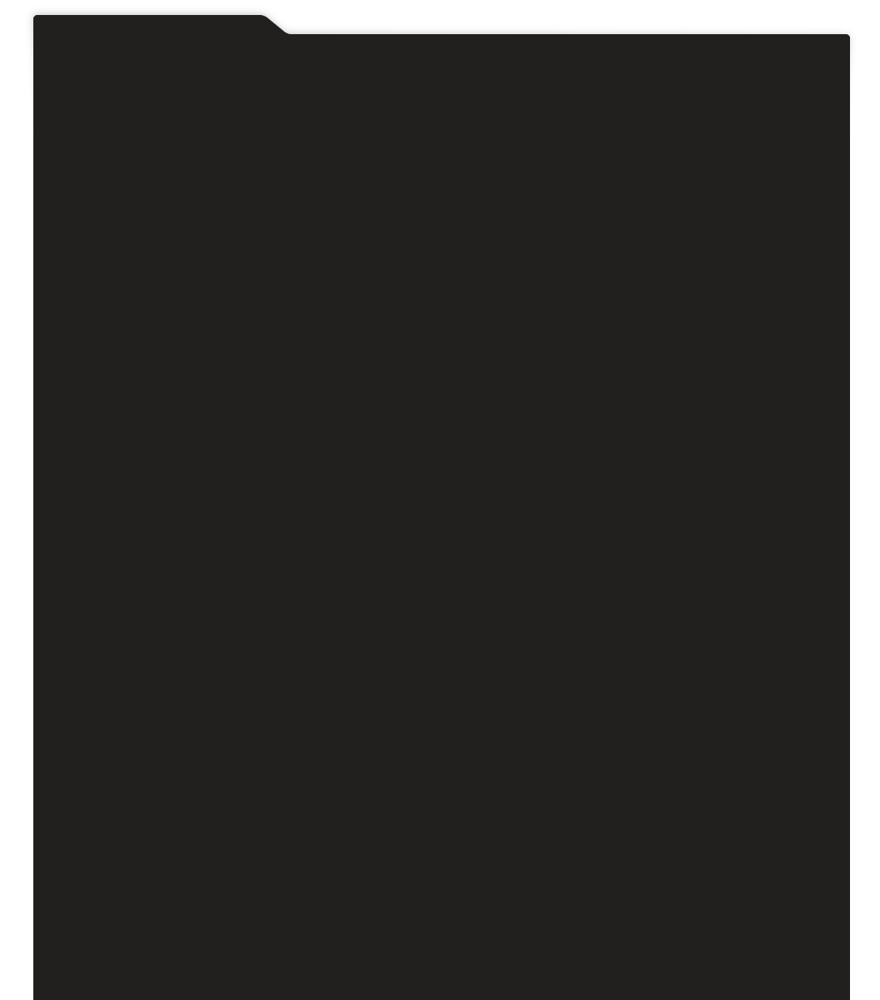
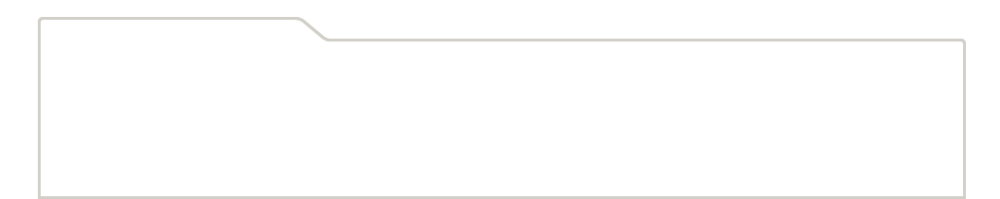
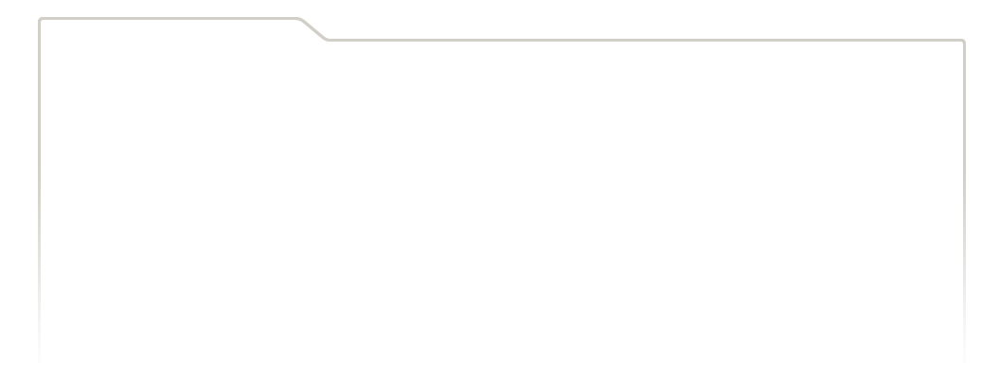
...
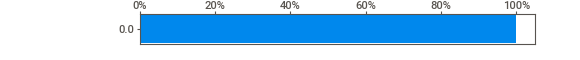
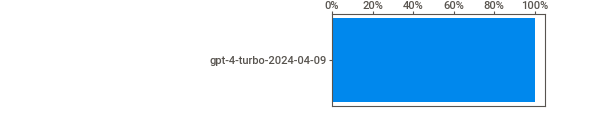
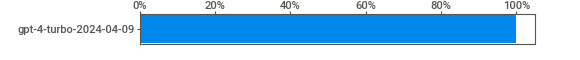
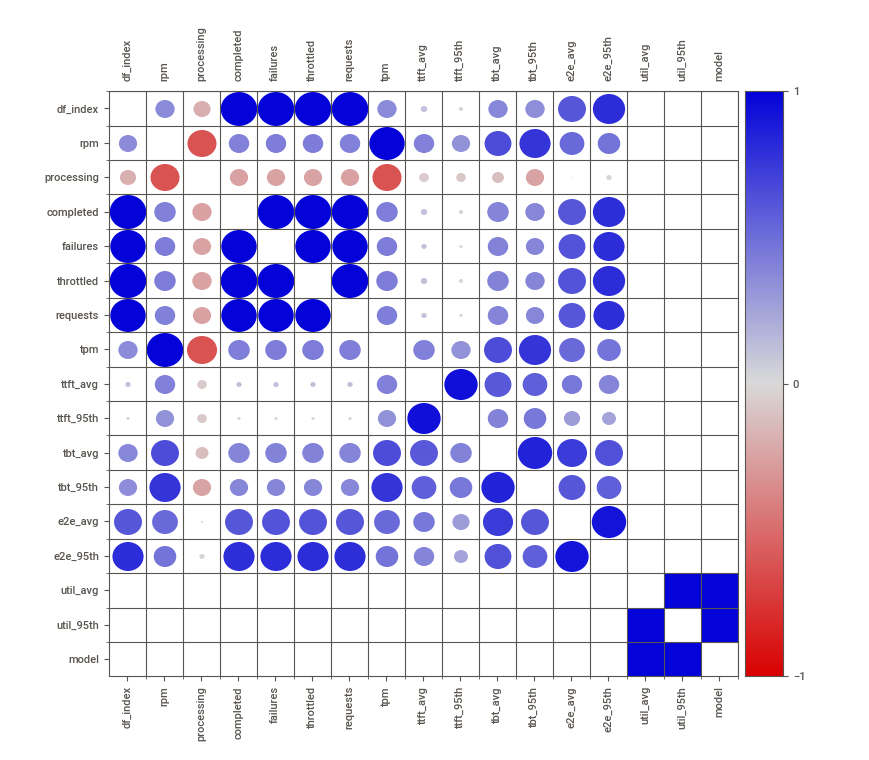
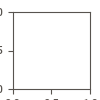

Report '/mnt/batch/tasks/shared/LS_root/mounts/clusters/seretkow9/code/Users/seretkow/Benchmarks/results/results_19Jun2024_161612/benchmarks_sweetviz_gpt-4-turbo-2024-04-09.html' was saved to storage.


In [51]:
report2.show_notebook(
    layout='widescreen',
    filepath=os.path.join(HOME, RESULTS_DIR,
                          f"benchmarks_sweetviz_{MODEL2}.html"),
)

### For all models

In [52]:
report_all = sv.analyze(all_df)
report_all.show_html(os.path.join(
    HOME, RESULTS_DIR, f"benchmarks_sweetviz_{MODEL1}_{MODEL2}.html"),
    open_browser=False)

                                             |          | [  0%]   00:00 -> (? left)

Report /mnt/batch/tasks/shared/LS_root/mounts/clusters/seretkow9/code/Users/seretkow/Benchmarks/results/results_19Jun2024_161612/benchmarks_sweetviz_gpt-4o_gpt-4-turbo-2024-04-09.html was generated.



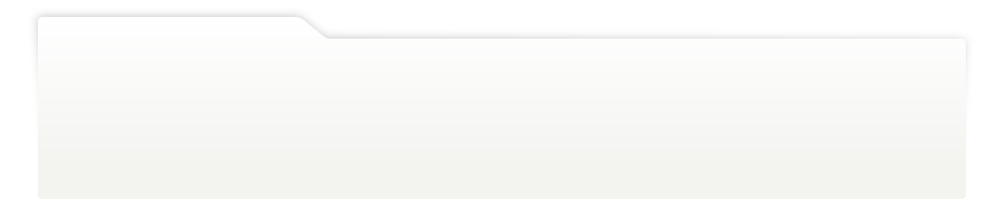
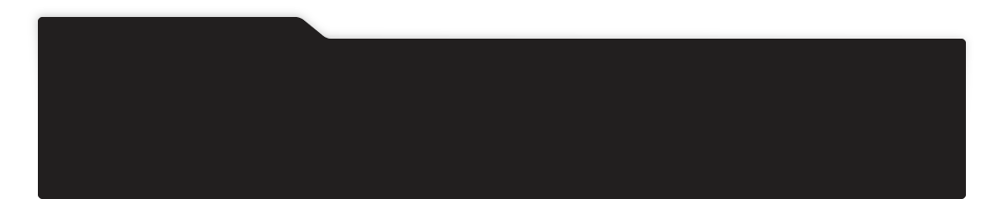
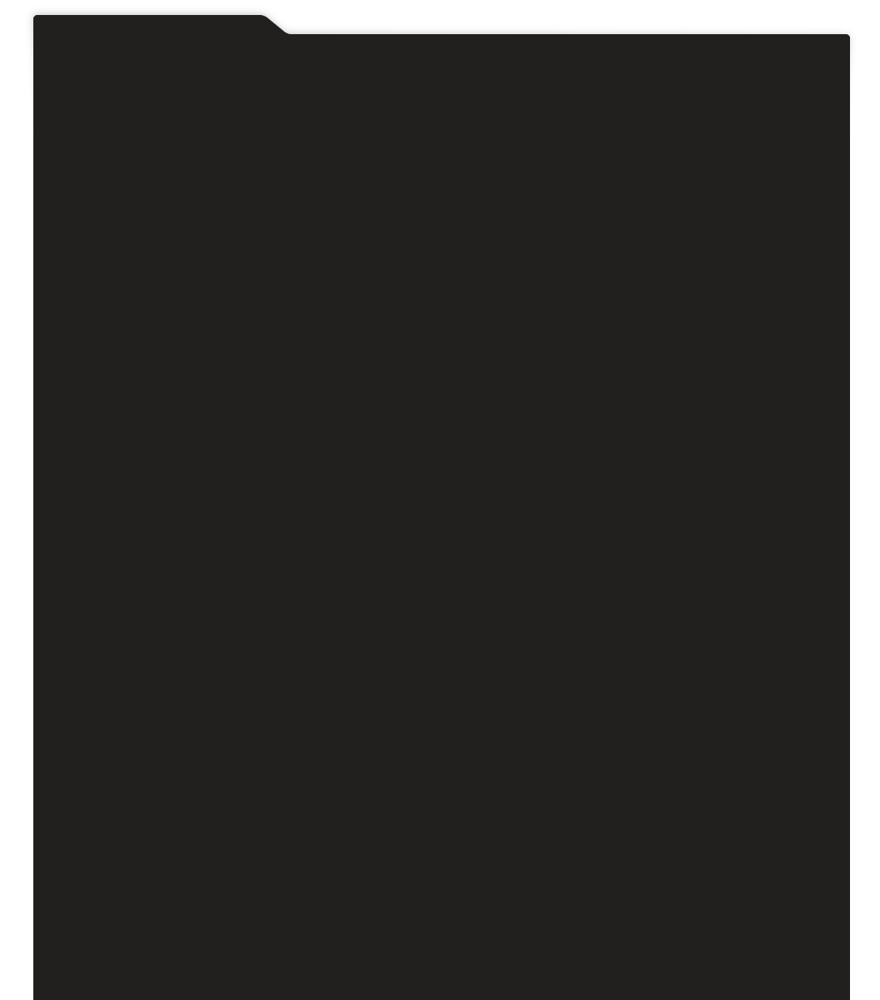
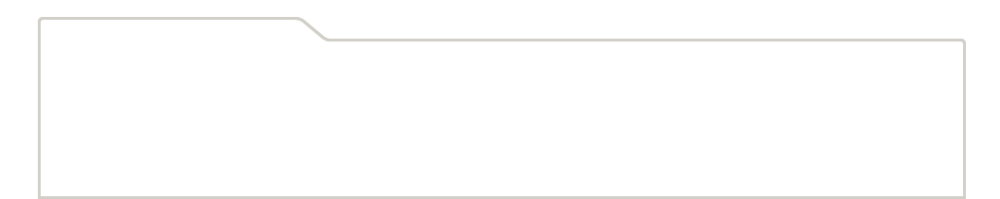
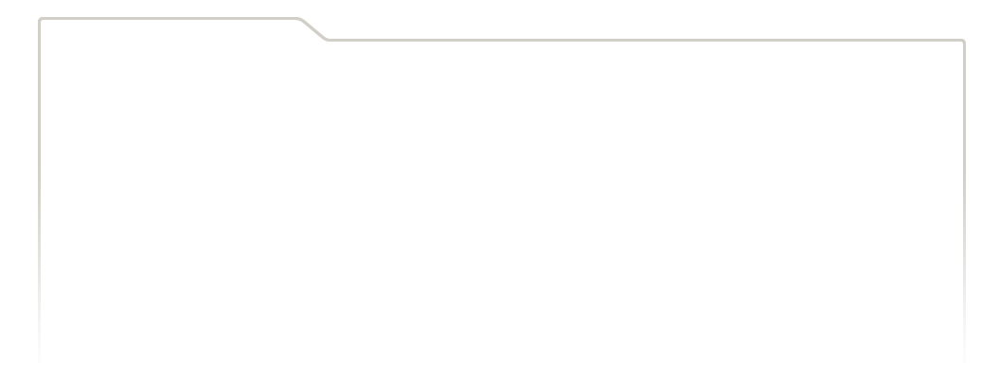
...
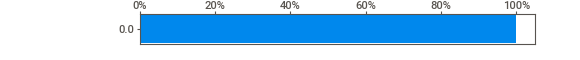
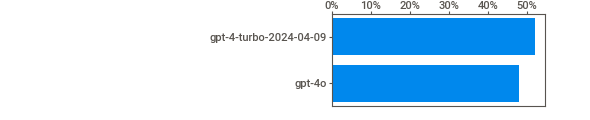
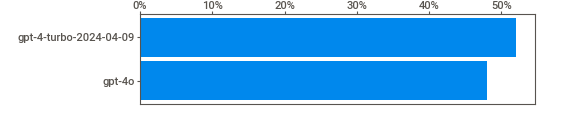
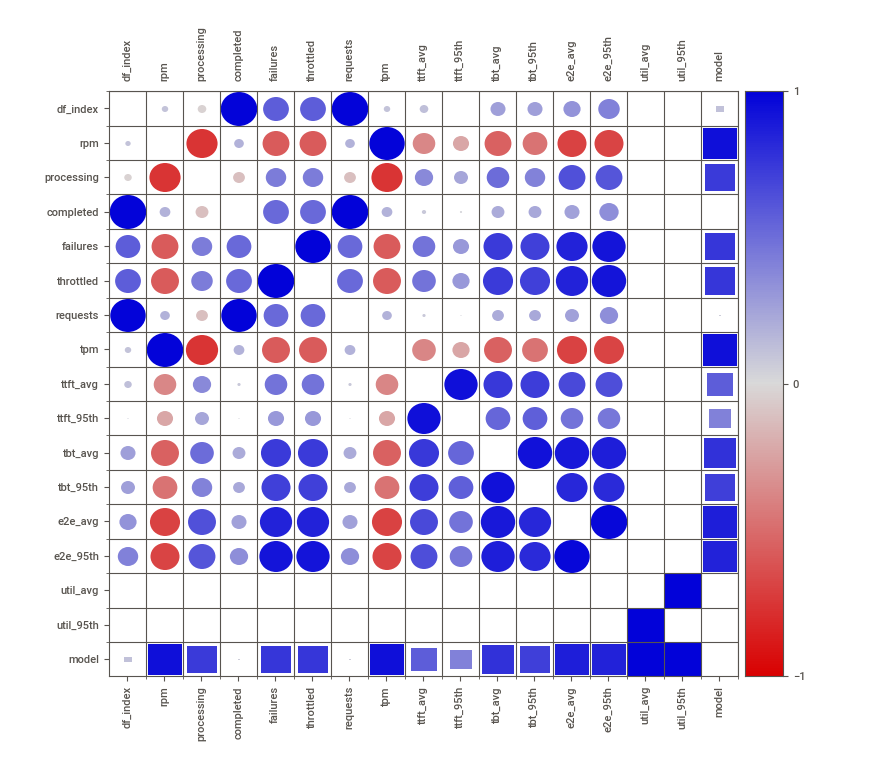
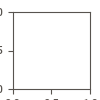

Report '/mnt/batch/tasks/shared/LS_root/mounts/clusters/seretkow9/code/Users/seretkow/Benchmarks/results/results_19Jun2024_161612/benchmarks_sweetviz_gpt-4o_gpt-4-turbo-2024-04-09.html' was saved to storage.


In [53]:
report_all.show_notebook(
    layout='widescreen',
    filepath=os.path.join(HOME, RESULTS_DIR,
                          f"benchmarks_sweetviz_{MODEL1}_{MODEL2}.html"),
)

## 09. Use Azure OpenAI to analyse the benchmarks results

In [54]:
benchmarks_results = os.path.join(HOME, RESULTS_DIR, f"benchmarks_{MODEL1}_and_{MODEL2}.xlsx")
df = pd.read_excel(benchmarks_results)

In [57]:
# Prompt
SYSTEM_MSG = "Analyze the following data. This dataset is a benchmarks about two GenAI models.\
You should provide insights for each model and generate a comparative analysis. Give some details:\n\n"

PROMPT = df.to_string(index=False)

# Setting up the AOAI client
client = AzureOpenAI(
        api_key=aoai_key,
        api_version=api_version,
        base_url=f"{api_base}/openai/deployments/{MODEL1}",
)

# Sending the request
response = client.chat.completions.create(
    model=f"{MODEL1}",
    messages=[
        {"role": "system", "content": SYSTEM_MSG},
        {"role": "user", "content": PROMPT},
    ],
    temperature=0.,
)

In [58]:
# Print the results
print("\033[1;31;34m")
print(response.choices[0].message.content)


### Insights for Each Model

#### GPT-4o
1. **Performance Metrics**:
   - **Requests per Minute (RPM)**: Starts at 0 and gradually increases, peaking at around 27 RPM.
   - **Throughput per Minute (TPM)**: Increases steadily, reaching a maximum of 40608.
   - **Time to First Token (TTFT)**: Average TTFT decreases over time, starting from 0.299 seconds and stabilizing around 0.161 seconds.
   - **End-to-End Latency (E2E)**: Average E2E latency starts at 6.142 seconds and decreases to around 5.995 seconds.
   - **Failures**: No failures recorded throughout the dataset.
   - **Utilization**: Remains at 0 throughout, indicating no throttling or resource constraints.

2. **Trends**:
   - **Efficiency**: The model becomes more efficient over time, as indicated by the decreasing TTFT and E2E latency.
   - **Scalability**: The model handles increasing requests without any failures, showing good scalability.

#### GPT-4-turbo-2024-04-09
1. **Performance Metrics**:
   - **Requests per Minute (R

## 10. Saved results

In [59]:
os.chdir(HOME)

In [60]:
excel_file = os.path.join(RESULTS_DIR,
                          f"benchmarks_{MODEL1}_and_{MODEL2}.xlsx")

excel_file_link = FileLink(path=excel_file)
excel_file_link

/mnt/batch/tasks/shared/LS_root/mounts/clusters/seretkow9/code/Users/seretkow/Benchmarks/results/results_19Jun2024_161612/benchmarks_gpt-4o_and_gpt-4-turbo-2024-04-09.xlsx

In [61]:
!ls $RESULTS_DIR/*.* -lt

-rwxrwxrwx 1 root root 1706047 Jun 19 16:35 results/results_19Jun2024_161612/benchmarks_sweetviz_gpt-4o_gpt-4-turbo-2024-04-09.html
-rwxrwxrwx 1 root root 1724849 Jun 19 16:35 results/results_19Jun2024_161612/benchmarks_sweetviz_gpt-4-turbo-2024-04-09.html
-rwxrwxrwx 1 root root 1393406 Jun 19 16:34 results/results_19Jun2024_161612/benchmarks_sweetviz_gpt-4o.html
-rwxrwxrwx 1 root root   52822 Jun 19 16:34 results/results_19Jun2024_161612/benchmarks_gpt-4o_and_gpt-4-turbo-2024-04-09.xlsx
-rwxrwxrwx 1 root root   29700 Jun 19 16:34 results/results_19Jun2024_161612/benchmarks_gpt-4-turbo-2024-04-09.xlsx
-rwxrwxrwx 1 root root   27549 Jun 19 16:34 results/results_19Jun2024_161612/benchmarks_gpt-4o.xlsx
-rwxrwxrwx 1 root root   86484 Jun 19 16:33 results/results_19Jun2024_161612/benchmarks_gpt-4-turbo-2024-04-09.txt
-rwxrwxrwx 1 root root   79860 Jun 19 16:26 results/results_19Jun2024_161612/benchmarks_gpt-4o.txt
